# Setup

In [1]:
!pip3 install scikit-learn
!pip3 install --upgrade ../.
!apt-get update
!apt-get install ffmpeg x264 libx264-dev libsm6 libxext6  -y
!pip install --upgrade opencv-python

     |████████████████████████████████| 22.3 MB 1.9 MB/s eta 0:00:01
     |████████████████████████████████| 303 kB 108.2 MB/s eta 0:00:01
Processing /app/alphafold
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.


  Created wheel for alphafold: filename=alphafold-2.0.0-py3-none-any.whl size=167358 sha256=9d81ebca67e5115a408134596c925900fff0c2b4d981ce7bf7e2ead438dfe718
  Stored in directory: /tmp/pip-ephem-wheel-cache-0f8vvhtg/wheels/24/78/39/1d9adc7578a3110de260b58b488a10309326e694fcdf4c2b43
Successfully built alphafold


In [112]:
from IPython.utils import io
import os
import subprocess
from tqdm.notebook import tqdm

import jax
import jax.numpy as jnp
import jax.lax as lax
from jax import jit
import haiku as hk

import sys
sys.path.append('/opt/conda/lib/python3.7/site-packages')

import os
os.environ['TF_FORCE_UNIFIED_MEMORY'] = '1'
os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '2.0'

from urllib import request
from concurrent import futures
import json
from matplotlib import gridspec
from matplotlib.colors import hsv_to_rgb
import matplotlib.pyplot as plt
import numpy as np
#import py3Dmol

from functools import partial
import math
import sklearn
from sklearn.decomposition import PCA
import scipy

import alphafold

from alphafold.data import parsers
from alphafold.data import pipeline
from alphafold.data.tools import jackhmmer

from alphafold.common import protein

from alphafold.relax import relax
from alphafold.relax import utils

from IPython import display
from ipywidgets import GridspecLayout
from ipywidgets import Output

from enum import Enum

from numpy.polynomial import polynomial as P

import cv2
from scipy.ndimage.filters import gaussian_filter

In [63]:
## alphafold-inspect

class MODEL_NAMES(Enum):
    model_1 = 'model_1'
    model_2 = 'model_2'
    model_3 = 'model_3'
    model_4 = 'model_4'
    model_5 = 'model_5'
    model_1_ptm = 'model_1_ptm'
    model_2_ptm = 'model_2_ptm'
    model_3_ptm = 'model_3_ptm'
    model_4_ptm = 'model_4_ptm'
    model_5_ptm = 'model_5_ptm'
    
    
def load_model(folder, model_name):
    model_name = MODEL_NAMES[model_name].value
    from alphafold.model import config
    from alphafold.model import data
    config = config.model_config(model_name)
    params = data.get_model_haiku_params(model_name, folder)
    return config, params


class _LayerWrapper:
    layer_name = "layer/"
    param_basename = 'alphafold/'
    param_keys = []
    pca_param_key = 0
    base_model = None
    
    def __init__(self, config, params=None, batch_shape=(1,), rng_key=0):
        self.config = config
        self.batch_shape = tuple(batch_shape)
        self.rng_key = jax.random.PRNGKey(rng_key)
        
        self.param_basename += self.layer_name
        self.param_names = [self.param_basename + k for k in self.param_keys]
        self.layer_param_names = [self.layer_name + k for k in self.param_keys]
        
        self.params = self.init_params()
        if params is not None:
            self.load_params(params)
            
        self.pca = PCA().fit(self.params[self.layer_param_names[self.pca_param_key]]["weights"].T)
        self.components = jax.device_put(self.pca.components_)
        
    @property
    def from_pca(self):
        @jax.jit
        def _from_pca(x):
            n_components = x.shape[-1]
            return jnp.matmul(x, self.components[:n_components])
        return _from_pca
    
    @property
    def to_pca(self, n_components=3):
        @jax.jit
        def _to_pca(x):
            return jnp.matmul(x, self.components[:n_components].T)
        return _to_pca
      
    @property
    def random_key(self):
        return jax.random.split(self.rng_key)[1]
        
    @property
    def init_shape(self):
        return (0,)
        
    def init_params(self):
        init_tensor = jnp.zeros(self.init_shape)
        layer_params = hk.data_structures.to_mutable_dict(self.forward_init(self.random_key, init_tensor))
        return layer_params
    
    def load_params(self, params):
        for b, p in zip(self.layer_param_names, self.param_names):
            pdict = {}
            for k, v in params[p].items():
                if getattr(self, 'layer_id', False):
                    v = v[self.layer_id]
                pdict[k] = v
            self.params[b] = pdict
    
    @property
    def local_config(self):
        return self.config
    
    @property
    def global_config(self):
        return self.config.model.global_config
    
    @property
    def model(self):
        name = self.layer_name.replace('/', '')
        return self.base_model(self.local_config, self.global_config, name=name)

    @property
    def _forward(self):
        def _forward(x):
            return self.model(x)
        return _forward
    
    @property
    def forward_init(self):
        return hk.transform(self._forward).init
    
    @property
    def forward_apply(self):
        apply = hk.transform(self._forward).apply
        return partial(apply, self.params, self.random_key)
    
    @property
    def forward_residual(self):
        @jax.jit
        def _forward_residual(x):
            return x + self.forward_apply(x)
        return _forward_residual
    
    @property
    def jacobian(self):
        return jax.jacfwd(self.forward_apply)
    
class Linear(hk.Module):
    def __init__(self,
               num_output: int,
               initializer: str = 'linear',
               use_bias: bool = True,
               bias_init: float = 0.,
               name: str = 'linear'):
        super().__init__(name=name)
        self.num_output = num_output
        self.initializer = initializer
        self.use_bias = use_bias
        self.bias_init = bias_init

    def __call__(self, inputs: jnp.ndarray) -> jnp.ndarray:
        n_channels = int(inputs.shape[-1])

        weight_shape = [n_channels, self.num_output]
        if self.initializer == 'linear':
            weight_init = hk.initializers.VarianceScaling(mode='fan_in', scale=1.)
        elif self.initializer == 'relu':
            weight_init = hk.initializers.VarianceScaling(mode='fan_in', scale=2.)
        elif self.initializer == 'zeros':
            weight_init = hk.initializers.Constant(0.0)

        weights = hk.get_parameter('weights', weight_shape, inputs.dtype,
                                   weight_init)

        output = jnp.einsum('...c,cd->...d', inputs, weights)
        # this is equivalent to einsum('...c,cd->...d', inputs, weights)
        # but turns out to be slightly faster
        #inputs = jnp.swapaxes(inputs, -1, -2)
        #output = jnp.einsum('...cb,cd->...db', inputs, weights)
        #output = jnp.swapaxes(output, -1, -2)

        if self.use_bias:
            bias = hk.get_parameter('bias', [self.num_output], inputs.dtype,
                                  hk.initializers.Constant(self.bias_init))
            output += bias

        return output
    
class TransitionRunner(hk.Module):
    def __init__(self, config, global_config, name='transition_block'):
        super().__init__(name=name)
        self.config = config
        self.global_config = global_config

    def __call__(self, act):
        nc = act.shape[-1]
        num_intermediate = int(nc * self.config.num_intermediate_factor)

        return hk.Sequential([
            hk.LayerNorm(
                axis=[-1],
                create_scale=True,
                create_offset=True,
                name='input_layer_norm'),
            Linear(
                num_intermediate,
                initializer='relu',
                name='transition1'),
            jax.nn.relu,
            Linear(
                nc,
                initializer=alphafold.model.utils.final_init(self.global_config),
                name='transition2')
        ])(act)
    
class PairTransition(_LayerWrapper):
    layer_name = "pair_transition/"
    param_basename = "alphafold/alphafold_iteration/evoformer/evoformer_iteration/"
    param_keys = ['input_layer_norm', 'transition1', 'transition2']
    pca_param_key = 1
    base_model = TransitionRunner
    
    def __init__(self, layer_id, *args, **kwargs):
        self.layer_id = layer_id
        super(PairTransition, self).__init__(*args, **kwargs)
        
    @property
    def init_shape(self):
        c = self.config.model.embeddings_and_evoformer.pair_channel
        return (c,)
        
    @property
    def local_config(self):
        return self.config.model.embeddings_and_evoformer.evoformer.pair_transition
    
    
def from_spherical(angle_grid, r):
    return np.stack([
        r * np.cos(angle_grid[...,0]) * np.sin(angle_grid[...,1]),
        r * np.sin(angle_grid[...,0]) * np.sin(angle_grid[...,1]),
        r * np.cos(angle_grid[..., 1])
    ], axis=-1)

def to_spherical(xyz):
    return np.stack([
        np.atan2(xyz[...,1], xyz[...,0]),
        np.atan2(np.linalg.norm(xyz[...,:2], axis=-1), xyz[...,2]),
        np.linalg.norm(xyz, axis=-1)
    ], axis=-1)

def get_grid_ns(n: int = 300, dims: int = 2, sizes = (-1.0, 1.0)):
    if type(n) is int:
        n = [n] * dims
    if type(sizes[0]) in [float, int]:
        sizes = [sizes] * dims

    steps = [np.linspace(sizes[i][0], sizes[i][1], n[i]) for i in range(dims)]
    return np.stack(np.meshgrid(*steps), axis=-1)

# Trajectory of Mean Iterated Eigenvalue Complex Magnitudes

In [64]:
layer_idx = 34
integrate = False

def loop(f, n):
    @jax.jit
    def step(i, x):
        return f(x)
    return partial(jax.lax.fori_loop, 1, n, step)

def loop_collect(forward_fn, out_fn, n, unroll=1):
    @jax.jit
    def step(x, _):
        y = forward_fn(x)
        return y, out_fn(y)
    return partial(jax.lax.scan, step, xs=None, length=n, unroll=unroll)

#runge-katta
def integrate(f, step_size=1):
    @jax.jit
    def _integrate(x):
        k1 = step_size * f(x)
        k2 = step_size * f(x + k1/2.)
        k3 = step_size * f(x + k2/2.)
        k4 = step_size * f(x + k3)
        
        return x + 1./6 * (k1 + 2 * k2 + 2 * k3 + k4)
    return _integrate

params_folder = '../alphafold/data'
model_name = 'model_2'

config, params = load_model(params_folder, model_name)
layer = PairTransition(layer_idx, config, params)

if integrate:
    forward_fn = integrate(layer.forward_residual, step_size=0.004)
else:
    forward_fn = layer.forward_residual
@jit
def pre_fn(x):
    proj = layer.from_pca(x)
    return proj#loop(layer.forward_residual, 256)(proj)
jac_fn = jit(layer.jacobian)

#cpu_fn = jit(jnp.linalg.eigvals, backend='cpu')
def cpu_fn(x, n):
    ys = []
    def step(x):
        y, x = np.linalg.eig(x)
        return x, y
    for i in range(n):
        x, y = step(x)
        ys.append(y)
    return np.stack(ys, axis=-1)

In [66]:
iterate_steps = 1002
num_frames = 257

from functools import partial
def eig_fn(vecs, vals=None):
    vals, vecs = jnp.linalg.eig(vecs)
    return vecs, vals
def cpu_fn(x):
    return jax.lax.scan(eig_fn, x, xs=None, length=iterate_steps)[1]
cpu_fn = jit(cpu_fn, backend='cpu')
    

point = jax.random.normal(layer.rng_key, (layer.init_shape[-1],))
point = pre_fn(point)

eigval_iters = []
for frame_idx in tqdm(range(num_frames)):
    jac = jac_fn(point)
    _eigval_iters = cpu_fn(jac.astype(jnp.complex64))
    #_eigval_iters = jit(partial(cpu_fn, n=iterate_steps), backend='cpu')(jac)[:,plot_skip_steps:]
    eigval_iters.append(_eigval_iters)
    point = forward_fn(point)
eigval_iters = np.stack(eigval_iters)

  0%|          | 0/257 [00:00<?, ?it/s]

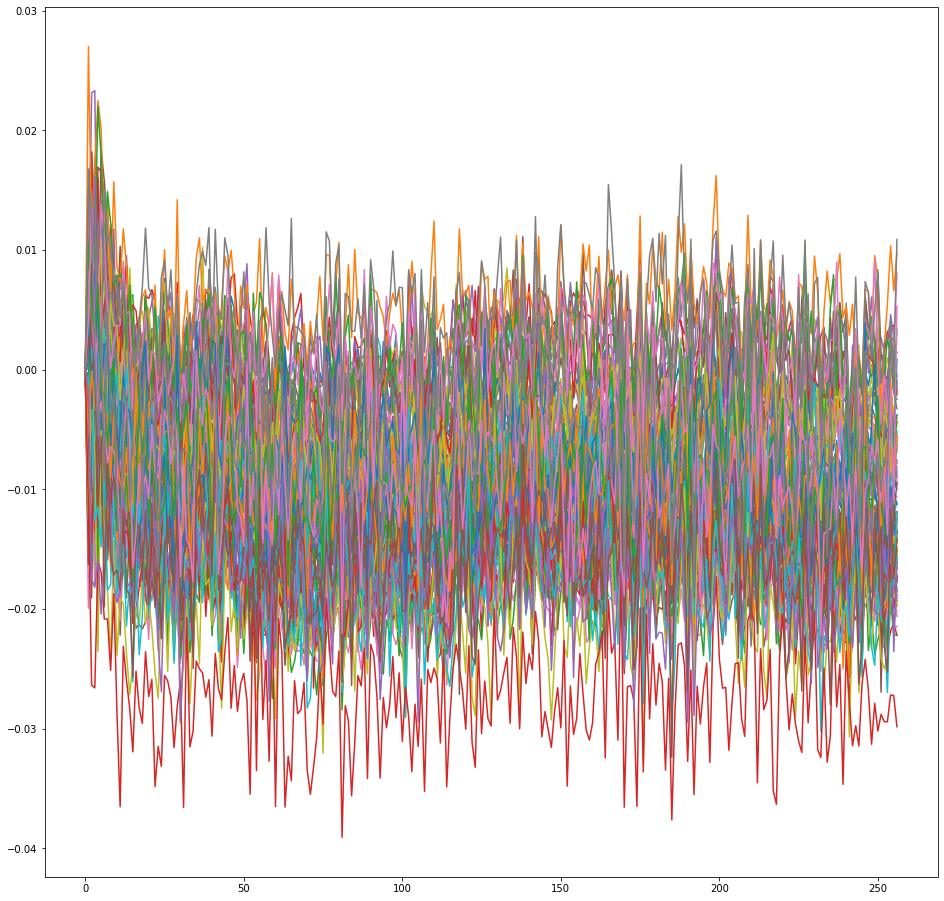

In [33]:
plot_skip_steps = 2

mies = np.log(np.absolute(eigval_iters).mean(axis=-2).T)
for i in range(mies.shape[0]):
    plt.plot(mies[i] - mies[i,0])
plt.gcf().set_size_inches(16, 16)
plt.show()

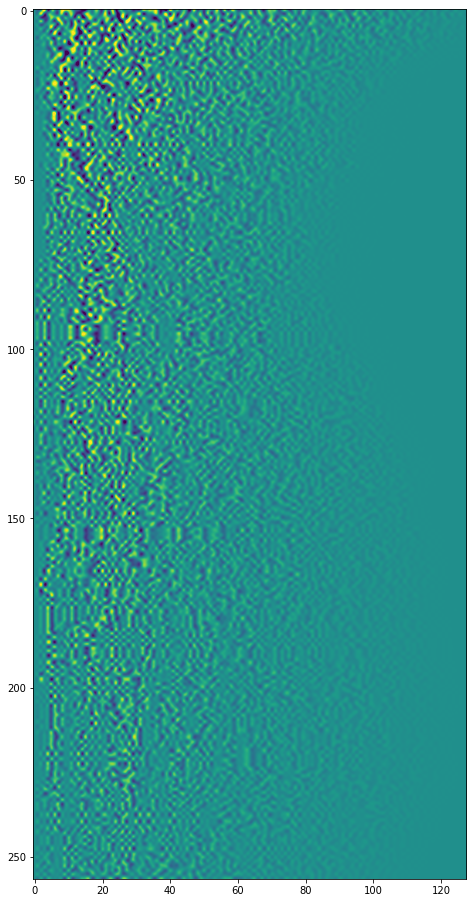

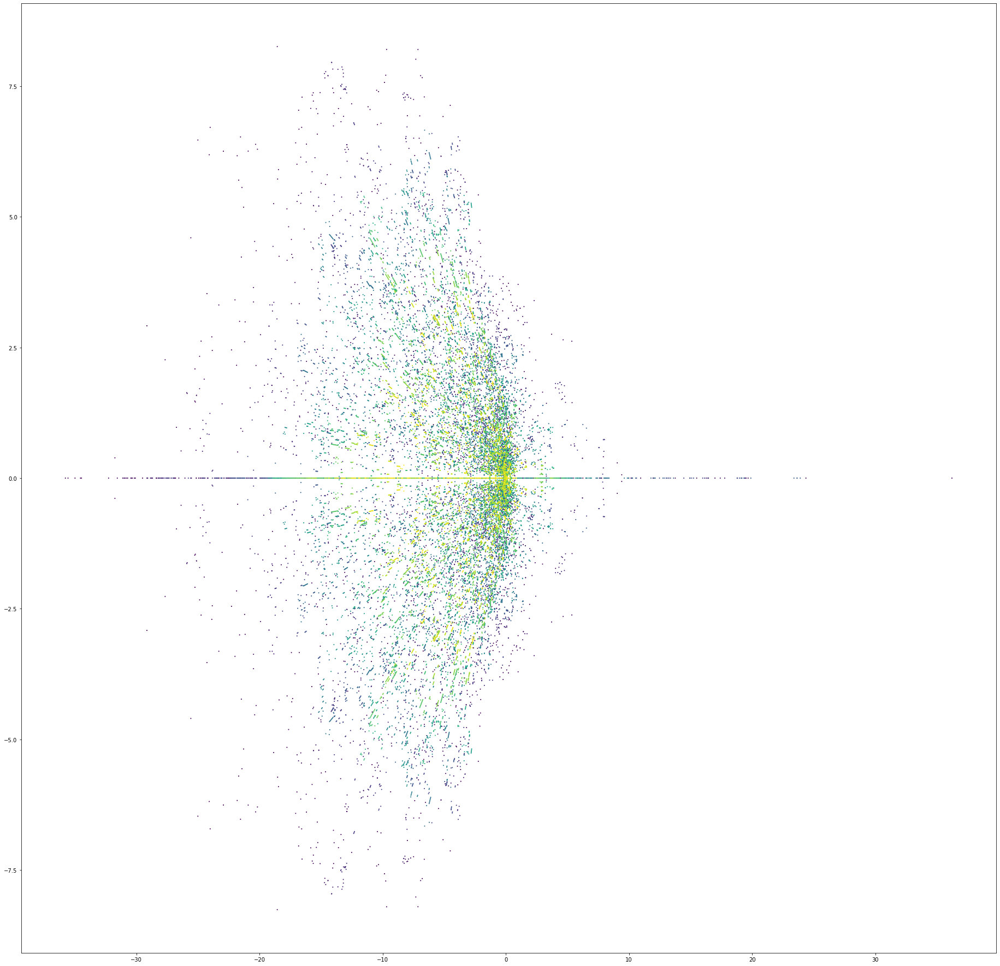

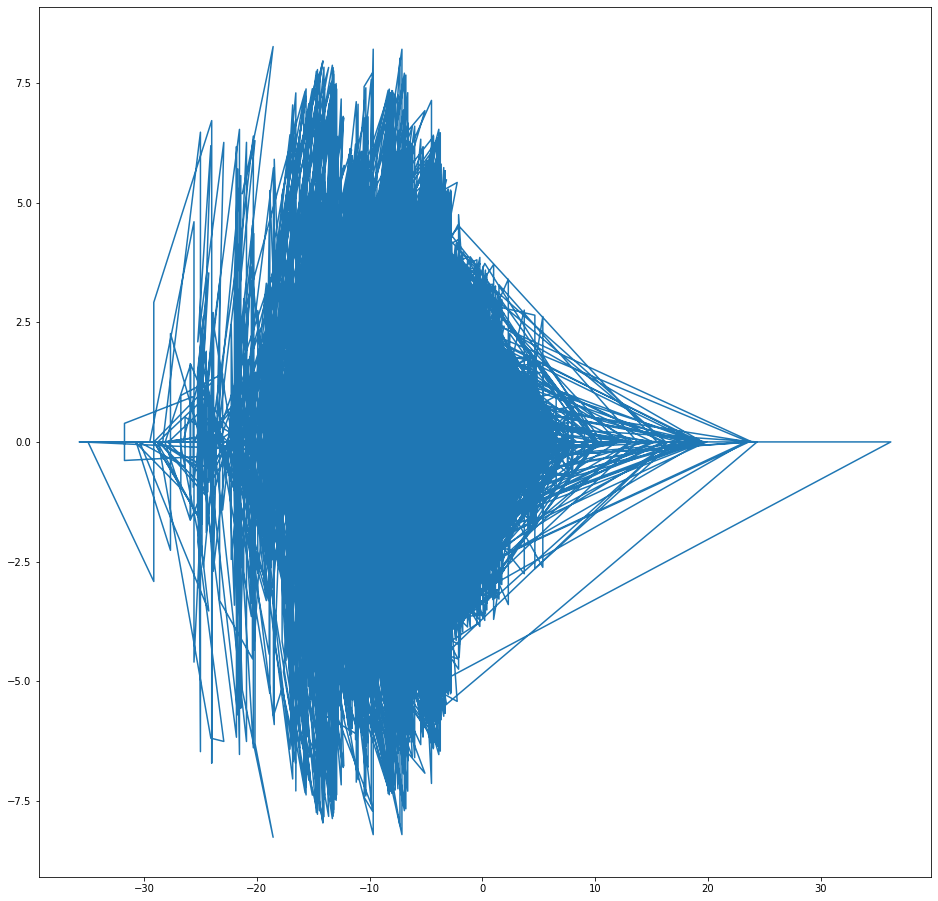

In [80]:
plt.imshow(eigval_iters[:,0,:].imag, interpolation="lanczos")
plt.gcf().set_size_inches(9, 16)
plt.show()

x = eigval_iters[:,0,:].real.reshape(-1)
x[x>0] = np.exp(x[x>0]) - 1
plt.scatter(
    x, 
    eigval_iters[:,0,:].imag.reshape(-1), 
    s=1,
    c=np.array([[plt.cm.viridis(i/eigval_iters.shape[0])]*eigval_iters.shape[-1] for i in range(eigval_iters.shape[0])]).reshape(-1, 4)
)
plt.gcf().set_size_inches(32, 32)
plt.show()

In [81]:
print(eigval_iters.shape)
np.save("alphafold_single_iter.npy", eigval_iters)

(257, 1002, 128)


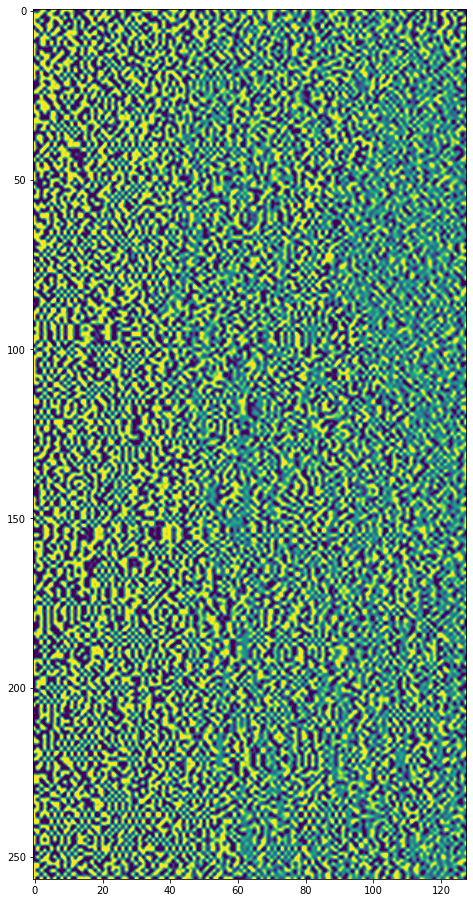

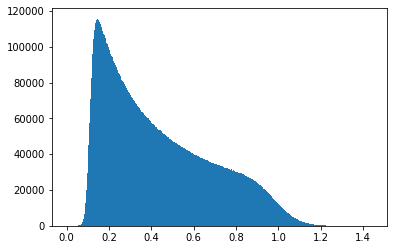

In [80]:
plt.imshow(np.angle(eigval_iters[:,0,:]), interpolation="lanczos")
plt.gcf().set_size_inches(9, 16)
plt.show()
plt.hist(np.abs(eigval_iters[:,1:,:]).reshape(-1), bins=1000)
plt.show()

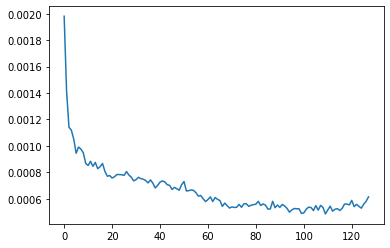

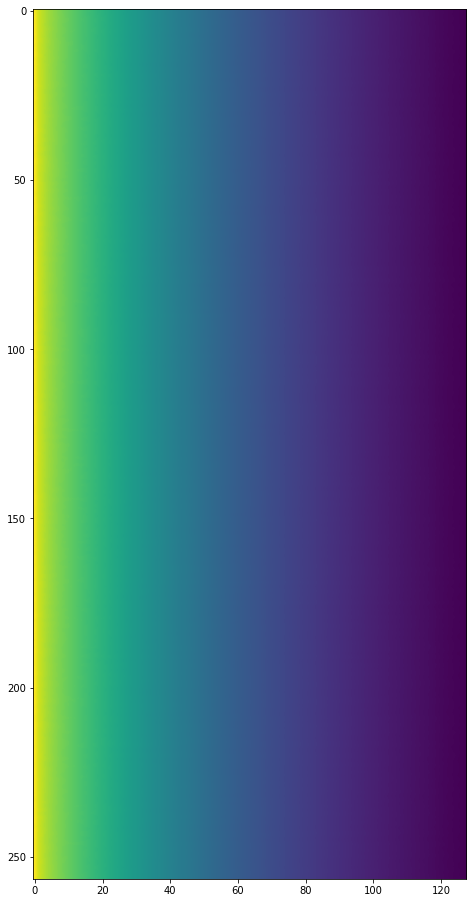

In [97]:
mies = np.abs(eigval_iters[:,2:,:]).mean(axis=1)
plt.plot(mies.std(axis=0))
plt.show()
plt.imshow(mies, interpolation="lanczos")
plt.gcf().set_size_inches(9, 16)
plt.show()

In [119]:
bins = 1080
lim = np.sqrt(2)
blur_sigma=1

def norm_hist(hist):
    hist = hist - hist.min()
    hist = hist / hist.max()
    return hist

frames = []
for i in tqdm(range(eigval_iters.shape[0])):
    hue_hist = np.zeros((bins, bins))
    int_hist = np.zeros((bins, bins))
    for j in range(eigval_iters.shape[2]):
        mag = np.abs(eigval_iters[i,2:,j])
        mag_min = mag.min()
        mag_max = mag.max()
        angle = np.angle(eigval_iters[i,2:,j])
        mag = np.log(mag)
        mag -= mag.min()
        mag /= mag.max() + 1e-9
        mag += mag_min
        mag *= mag_max
        hist, _, _ = np.histogram2d(
            #eigval_iters[i,2:,j].real.reshape(-1),
            #eigval_iters[i,2:,j].imag.reshape(-1),
            np.cos(angle) * mag,
            np.sin(angle) * mag,
            bins=bins,
            range=[[-lim, lim], [-lim, lim]],
            density=True
        )
        
        #bias_term = eigval_iters[i,0,j].imag
        bias_term = j
        
        blur_hist = hist
        if blur_sigma > 1:
            blur_hist = gaussian_filter(hist, sigma=blur_sigma)
            
        hue_hist += blur_hist * bias_term
        int_hist += hist
    hue_hist -= hue_hist.min()
    hue_hist /= hue_hist.max() + 1e-9
    int_hist = np.log(int_hist + 1e-6)
    int_hist[int_hist < 0] = 0
    int_hist /= int_hist.max() + 1e-6

    rgb = hsv_to_rgb(
        np.stack(
            [hue_hist, 
            np.ones_like(hue_hist), 
            int_hist],
            axis=-1
        )
    )
    frames.append(rgb)

  0%|          | 0/257 [00:00<?, ?it/s]

In [120]:
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
fps = 4
video_filename = 'alphafold_iter_complex_plane.mp4'
out = cv2.VideoWriter(video_filename, fourcc, fps, frames[0].shape[:2])

for i, f in enumerate(frames):
    frame = (f * 255.99).astype(np.uint8)
    cv2.putText(
        frame,
        F"step {i+1}",
        (10, 30),
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (255, 255, 255),
        2,
        cv2.LINE_4
    )
    out.write(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
out.release()

In [4]:
import numpy as np
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb

In [84]:
n = 225
samples = 60
iters = 100
skip_iters = 2

eigvals = []
for i in tqdm(range(1, n + 1)):
    eigvals.append(np.zeros(
        (samples, i, iters + skip_iters),
        dtype=np.complex64
    ))
    for j in tqdm(range(samples), leave=False):
        vecs = np.random.randn(i, i)
        for k in range(skip_iters + iters):
            vals, vecs = np.linalg.eig(vecs)
            eigvals[-1][j,:,k] = vals

  0%|          | 0/225 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

In [88]:
eigvals[-1].shape

(60, 225, 102)

In [90]:
np.savez("temp.npz", **{str(i): eigvals[i] for i in range(len(eigvals))})

In [5]:
eigvals = [array for array in np.load("temp.npz").values()]

  0%|          | 0/225 [00:00<?, ?it/s]

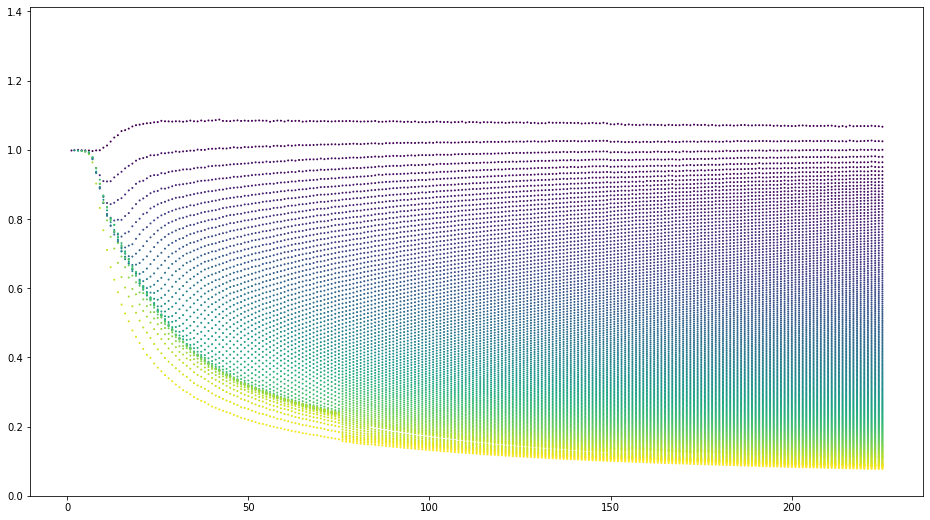

In [6]:
for dim_idx in tqdm(range(len(eigvals))):
    magnitudes = np.abs(eigvals[dim_idx])[...,2:]
    magnitudes = magnitudes.mean(axis=-1).mean(axis=0)
    x = np.full_like(magnitudes, dim_idx + 1)
    colors = np.arange(magnitudes.shape[0]) % eigvals[dim_idx].shape[1]
    colors = colors / eigvals[dim_idx].shape[1]
    colors = plt.cm.viridis(colors)
    plt.scatter(x, magnitudes, c=colors, s=1)
plt.ylim(0, np.sqrt(2))
plt.gcf().set_size_inches(16, 9)
plt.show()

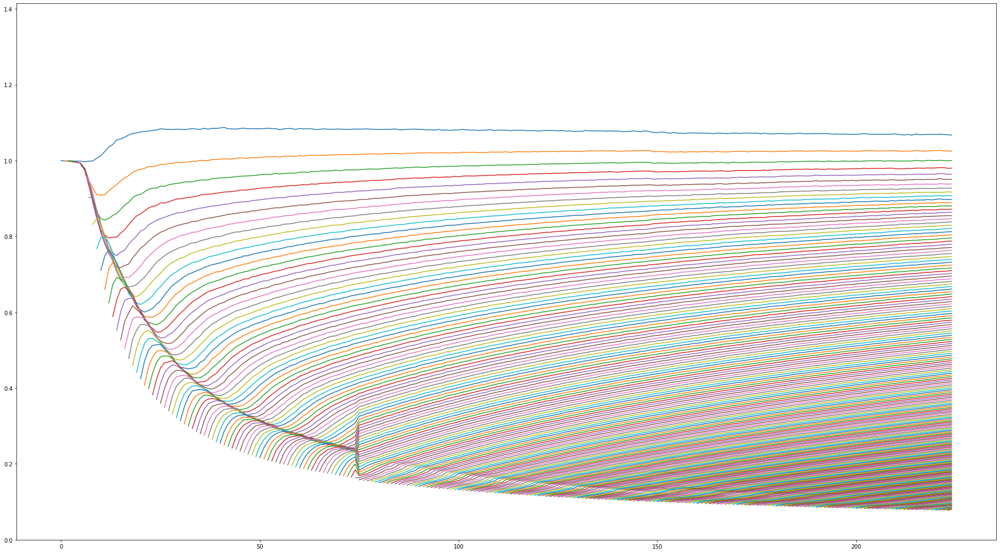

In [7]:
ys = []
for dim_idx in range(len(eigvals)):
    magnitudes = np.abs(eigvals[dim_idx])[...,2:]
    magnitudes = magnitudes.mean(axis=-1).mean(axis=0)
    ys.append(magnitudes)
    
for dim_idx in range(len(ys)):
    x = np.arange(dim_idx, len(ys))
    y = [y[dim_idx] for y in ys[dim_idx:]]
    plt.plot(x, y)
plt.ylim(0, np.sqrt(2))
plt.gcf().set_size_inches(32, 18)
plt.show()

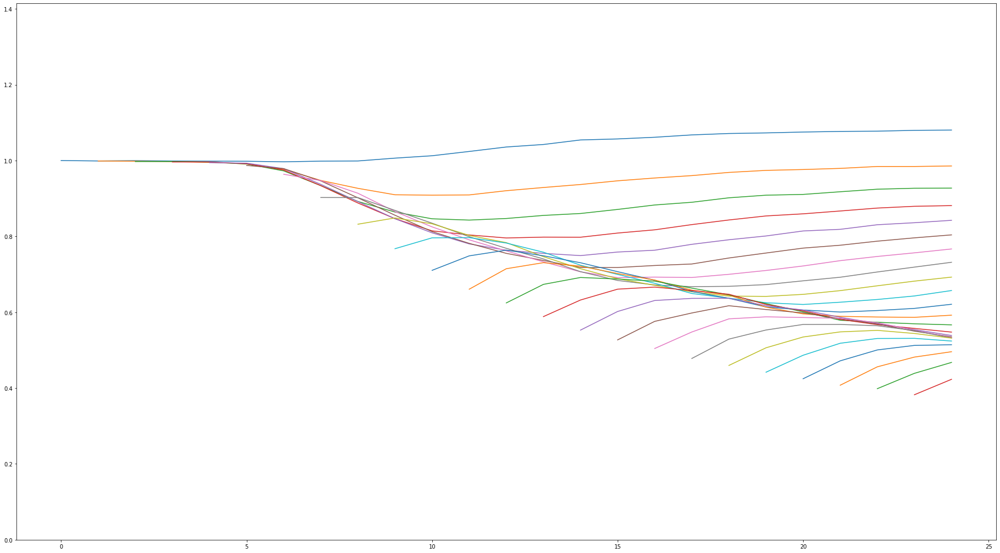

In [148]:
nlim = 25

ys = []
for dim_idx in range(nlim):#len(eigvals)):
    magnitudes = np.abs(eigvals[dim_idx])[...,2:]
    magnitudes = magnitudes.mean(axis=-1).mean(axis=0)
    ys.append(magnitudes)
    
for dim_idx in range(nlim):#len(ys)):
    x = np.arange(dim_idx, len(ys))
    y = [y[dim_idx] for y in ys[dim_idx:]]
    plt.plot(x, y)
plt.ylim(0, np.sqrt(2))
plt.gcf().set_size_inches(32, 18)
plt.show()

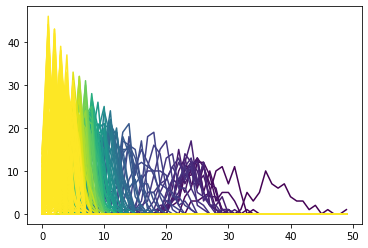

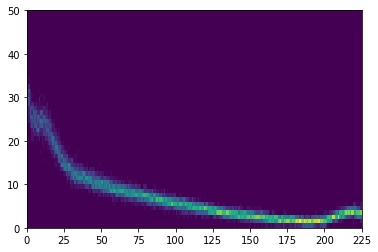

In [119]:
bins = 50

devs = np.abs(eigvals[-1][...,2:]).std(axis=-1)
dev_hists = []
for i in range(eigvals[-1].shape[1]):
    dev_hist, _ = np.histogram(
        devs[:,i], 
        bins=bins, 
        range=(devs.min(), devs.max())
    )
    dev_hists.append(dev_hist)
    color = plt.cm.viridis(i/eigvals[-1].shape[-1])
    plt.plot(dev_hist, color=color)
plt.show()

plt.pcolormesh(
    np.stack(dev_hists).T,
    #np.linspace(0, eigvals[-1].shape[1], eigvals[-1].shape[1]),
    #np.linspace(devs.min(), devs.max(), bins)
)
plt.show()

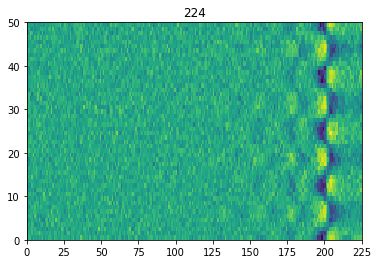

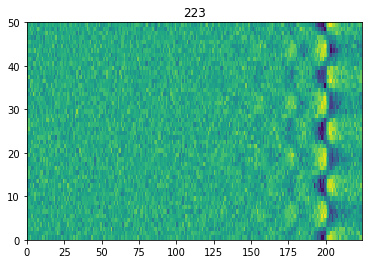

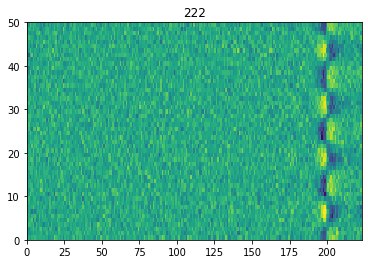

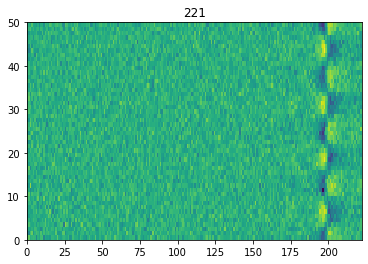

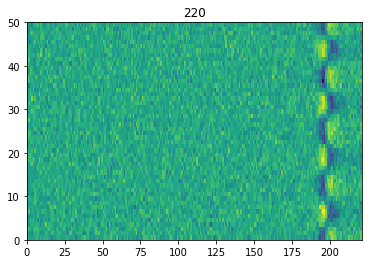

...

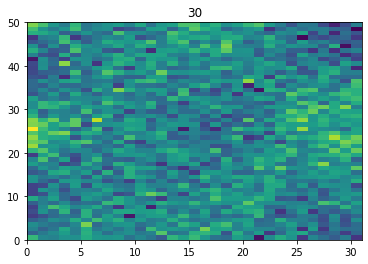

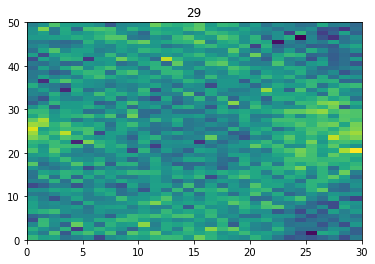

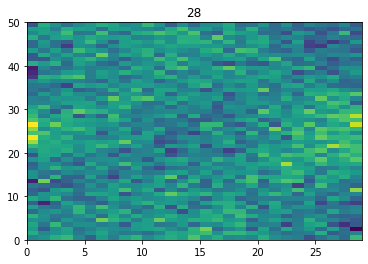

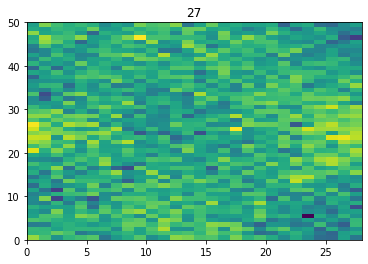

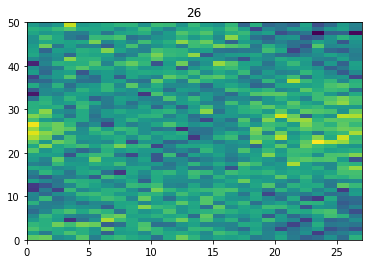

In [145]:
bins = 50

for i in range(1, 200, 1):
    devs = np.angle(eigvals[-i][...,2:])
    dev_hists = []
    for idx in range(eigvals[-i].shape[1]):
        dev_hist, _ = np.histogram(
            devs[:,idx,:].reshape(-1), 
            bins=bins, 
            range=(devs.min(), devs.max())
        )
        dev_hists.append(dev_hist)
    plt.pcolormesh(np.log(np.stack(dev_hists)).T)
    plt.title(225-i)
    plt.show()

In [89]:
from scipy.ndimage.filters import gaussian_filter

n_bins = 1080
blur_sigma = 5
lim = 2 #np.sqrt(2)
n_dims = 225

frames = []
for dim in tqdm(range(n_dims)):
    test = eigvals[dim][...,2:].transpose(1, 0, 2).reshape(dim+1, -1)
    full_hist = np.zeros((n_bins, n_bins))
    mag_hist = np.zeros((n_bins, n_bins))
    for i in range(dim+1):
        #scale magnitude
        mag = np.abs(test[i])
        mag_min = mag.min()
        mag_max = mag.max()
        angle = np.angle(test[i])
        mag = np.log(mag)
        mag -= mag.min()
        mag /= mag.max() + 1e-9
        mag += mag_min
        mag *= mag_max


        hist, xedges, yedges = np.histogram2d(
            #test[i].real, 
            #test[i].imag,
            np.cos(angle) * mag,
            np.sin(angle) * mag,
            bins=n_bins,
            range=[[-lim, lim], [-lim, lim]],
            density=True
        )
        full_hist += gaussian_filter(hist, sigma=blur_sigma) * i
        mag_hist += hist
    full_hist /= full_hist.max() + 1e-9
    mag_hist = np.log(mag_hist + 1e-6)
    mag_hist[mag_hist < 0] = 0
    mag_hist /= mag_hist.max() + 1e-6

    rgb = hsv_to_rgb(
        np.stack(
            [full_hist, 
            np.ones_like(full_hist), 
            mag_hist],
            axis=-1
        )
    )
    frames.append(rgb)

  0%|          | 0/225 [00:00<?, ?it/s]

In [4]:
!pip uninstall -y opencv-python

In [5]:
!apt-get update
!apt-get install ffmpeg x264 libx264-dev libsm6 libxext6  -y
!pip install --upgrade opencv-python
import cv2

Get:1 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal InRelease [265 kB]                
Ign:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  Release [696 B]
Get:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  Release.gpg [836 B]
Get:6 http://security.ubuntu.com/ubuntu focal-security/universe amd64 Packages [796 kB]
Get:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  Packages [415 kB]
Get:8 http://security.ubuntu.com/ubuntu focal-security/main amd64 Packages [1076 kB]
Get:9 http://security.ubuntu.com/ubuntu focal-security/multiverse amd64 Packages [30.1 kB]
Get:10 http://security.ubuntu.com/ubuntu focal-security/restricted amd64 Packages [529 kB]
Get:11 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]       
Get:12 http://archi

Get:7 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 libglib2.0-data all 2.64.6-1~ubuntu20.04.4 [6052 B]
Get:8 http://archive.ubuntu.com/ubuntu focal/main amd64 libslang2 amd64 2.3.2-4 [429 kB]
Get:9 http://archive.ubuntu.com/ubuntu focal/main amd64 libsodium23 amd64 1.0.18-1 [150 kB]
Get:10 http://archive.ubuntu.com/ubuntu focal/main amd64 shared-mime-info amd64 1.15-1 [430 kB]
Get:11 http://archive.ubuntu.com/ubuntu focal/main amd64 ucf all 3.0038+nmu1 [51.6 kB]
Get:12 http://archive.ubuntu.com/ubuntu focal/main amd64 xdg-user-dirs amd64 0.17-2ubuntu1 [48.3 kB]
Get:13 http://archive.ubuntu.com/ubuntu focal/main amd64 xkb-data all 2.29-2 [349 kB]
Get:14 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 libdrm-common all 2.4.105-3~20.04.1 [5640 B]
Get:15 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 libdrm2 amd64 2.4.105-3~20.04.1 [32.4 kB]
Get:16 http://archive.ubuntu.com/ubuntu focal/main amd64 libnuma1 amd64 2.0.12-1 [20.8 kB]
Get:17 http://archive.ubu

Get:89 http://archive.ubuntu.com/ubuntu focal/main amd64 libvorbisfile3 amd64 1.3.6-2ubuntu1 [16.1 kB]
Get:90 http://archive.ubuntu.com/ubuntu focal/universe amd64 libopenmpt0 amd64 0.4.11-1build1 [599 kB]
Get:91 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 libssh-gcrypt-4 amd64 0.9.3-2ubuntu2.2 [202 kB]
Get:92 http://archive.ubuntu.com/ubuntu focal-updates/universe amd64 libavformat58 amd64 7:4.2.4-1ubuntu0.1 [981 kB]
Get:93 http://archive.ubuntu.com/ubuntu focal/universe amd64 libbs2b0 amd64 3.1.0+dfsg-2.2build1 [10.2 kB]
Get:94 http://archive.ubuntu.com/ubuntu focal/universe amd64 libflite1 amd64 2.1-release-3 [12.8 MB]
Get:95 http://archive.ubuntu.com/ubuntu focal/universe amd64 libserd-0-0 amd64 0.30.2-1 [46.6 kB]
Get:96 http://archive.ubuntu.com/ubuntu focal/universe amd64 libsord-0-0 amd64 0.16.4-1 [19.5 kB]
Get:97 http://archive.ubuntu.com/ubuntu focal/universe amd64 libsratom-0-0 amd64 0.6.4-1 [16.9 kB]
Get:98 http://archive.ubuntu.com/ubuntu focal-updates/univers

Selecting previously unselected package libcairo2:amd64.
Preparing to unpack .../036-libcairo2_1.16.0-4ubuntu1_amd64.deb ...
Unpacking libcairo2:amd64 (1.16.0-4ubuntu1) ...
Selecting previously unselected package libcodec2-0.9:amd64.
Preparing to unpack .../037-libcodec2-0.9_0.9.2-2_amd64.deb ...
Unpacking libcodec2-0.9:amd64 (0.9.2-2) ...
Selecting previously unselected package libgsm1:amd64.
Preparing to unpack .../038-libgsm1_1.0.18-2_amd64.deb ...
Unpacking libgsm1:amd64 (1.0.18-2) ...
Selecting previously unselected package libmp3lame0:amd64.
Preparing to unpack .../039-libmp3lame0_3.100-3_amd64.deb ...
Unpacking libmp3lame0:amd64 (3.100-3) ...
Selecting previously unselected package libopenjp2-7:amd64.
Preparing to unpack .../040-libopenjp2-7_2.3.1-1ubuntu4.20.04.1_amd64.deb ...
Unpacking libopenjp2-7:amd64 (2.3.1-1ubuntu4.20.04.1) ...
Selecting previously unselected package libopus0:amd64.
Preparing to unpack .../041-libopus0_1.3.1-0ubuntu1_amd64.deb ...
Unpacking libopus0:amd64

Selecting previously unselected package libavc1394-0:amd64.
Preparing to unpack .../082-libavc1394-0_0.5.4-5_amd64.deb ...
Unpacking libavc1394-0:amd64 (0.5.4-5) ...
Selecting previously unselected package libass9:amd64.
Preparing to unpack .../083-libass9_1%3a0.14.0-2_amd64.deb ...
Unpacking libass9:amd64 (1:0.14.0-2) ...
Selecting previously unselected package libbluray2:amd64.
Preparing to unpack .../084-libbluray2_1%3a1.2.0-1_amd64.deb ...
Unpacking libbluray2:amd64 (1:1.2.0-1) ...
Selecting previously unselected package libchromaprint1:amd64.
Preparing to unpack .../085-libchromaprint1_1.4.3-3build1_amd64.deb ...
Unpacking libchromaprint1:amd64 (1.4.3-3build1) ...
Selecting previously unselected package libgme0:amd64.
Preparing to unpack .../086-libgme0_0.6.2-1build1_amd64.deb ...
Unpacking libgme0:amd64 (0.6.2-1build1) ...
Selecting previously unselected package libmpg123-0:amd64.
Preparing to unpack .../087-libmpg123-0_1.25.13-1_amd64.deb ...
Unpacking libmpg123-0:amd64 (1.25.13

Selecting previously unselected package libllvm12:amd64.
Preparing to unpack .../130-libllvm12_1%3a12.0.0-3ubuntu1~20.04.3_amd64.deb ...
Unpacking libllvm12:amd64 (1:12.0.0-3ubuntu1~20.04.3) ...
Selecting previously unselected package libsensors-config.
Preparing to unpack .../131-libsensors-config_1%3a3.6.0-2ubuntu1_all.deb ...
Unpacking libsensors-config (1:3.6.0-2ubuntu1) ...
Selecting previously unselected package libsensors5:amd64.
Preparing to unpack .../132-libsensors5_1%3a3.6.0-2ubuntu1_amd64.deb ...
Unpacking libsensors5:amd64 (1:3.6.0-2ubuntu1) ...
Selecting previously unselected package libvulkan1:amd64.
Preparing to unpack .../133-libvulkan1_1.2.131.2-1_amd64.deb ...
Unpacking libvulkan1:amd64 (1.2.131.2-1) ...
Selecting previously unselected package libgl1-mesa-dri:amd64.
Preparing to unpack .../134-libgl1-mesa-dri_21.0.3-0ubuntu0.3~20.04.1_amd64.deb ...
Unpacking libgl1-mesa-dri:amd64 (21.0.3-0ubuntu0.3~20.04.1) ...
Selecting previously unselected package libglx-mesa0:amd

Selecting previously unselected package libxcb-randr0:amd64.
Preparing to unpack .../176-libxcb-randr0_1.14-2_amd64.deb ...
Unpacking libxcb-randr0:amd64 (1.14-2) ...
Selecting previously unselected package mesa-va-drivers:amd64.
Preparing to unpack .../177-mesa-va-drivers_21.0.3-0ubuntu0.3~20.04.1_amd64.deb ...
Unpacking mesa-va-drivers:amd64 (21.0.3-0ubuntu0.3~20.04.1) ...
Selecting previously unselected package mesa-vdpau-drivers:amd64.
Preparing to unpack .../178-mesa-vdpau-drivers_21.0.3-0ubuntu0.3~20.04.1_amd64.deb ...
Unpacking mesa-vdpau-drivers:amd64 (21.0.3-0ubuntu0.3~20.04.1) ...
Selecting previously unselected package mesa-vulkan-drivers:amd64.
Preparing to unpack .../179-mesa-vulkan-drivers_21.0.3-0ubuntu0.3~20.04.1_amd64.deb ...
Unpacking mesa-vulkan-drivers:amd64 (21.0.3-0ubuntu0.3~20.04.1) ...
Selecting previously unselected package i965-va-driver:amd64.
Preparing to unpack .../180-i965-va-driver_2.4.0-0ubuntu1_amd64.deb ...
Unpacking i965-va-driver:amd64 (2.4.0-0ubuntu

Setting up libdrm2:amd64 (2.4.105-3~20.04.1) ...
Setting up libflite1:amd64 (2.1-release-3) ...
Setting up libva-drm2:amd64 (2.7.0-2) ...
Setting up libsord-0-0:amd64 (0.16.4-1) ...
Setting up libwayland-cursor0:amd64 (1.18.0-1) ...
Setting up libsratom-0-0:amd64 (0.6.4-1) ...
Setting up libharfbuzz0b:amd64 (2.6.4-1ubuntu4) ...
Setting up libtiff5:amd64 (4.1.0+git191117-2ubuntu0.20.04.1) ...
Setting up libfontconfig1:amd64 (2.13.1-2ubuntu3) ...
Setting up libsndfile1:amd64 (1.0.28-7ubuntu0.1) ...
Setting up libbluray2:amd64 (1:1.2.0-1) ...
Setting up libva-x11-2:amd64 (2.7.0-2) ...
Setting up libsm6:amd64 (2:1.2.3-1) ...
Setting up liblilv-0-0:amd64 (0.24.6-1ubuntu0.1) ...
Setting up libopenmpt0:amd64 (0.4.11-1build1) ...
Setting up libdrm-amdgpu1:amd64 (2.4.105-3~20.04.1) ...
Setting up mesa-vulkan-drivers:amd64 (21.0.3-0ubuntu0.3~20.04.1) ...
Setting up fontconfig (2.13.1-2ubuntu3) ...
Regenerating fonts cache... done.
Setting up libdrm-nouveau2:amd64 (2.4.105-3~20.04.1) ...
Setting 

In [90]:
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
fps = 5
video_filename = 'output2.mp4'
out = cv2.VideoWriter(video_filename, fourcc, fps, frames[0].shape[:2])

for i, f in enumerate(frames):
    frame = (f * 255.99).astype(np.uint8)
    cv2.putText(
        frame,
        F"n={i+1}",
        (10, 30),
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (255, 255, 255),
        2,
        cv2.LINE_4
    )
    out.write(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
out.release()

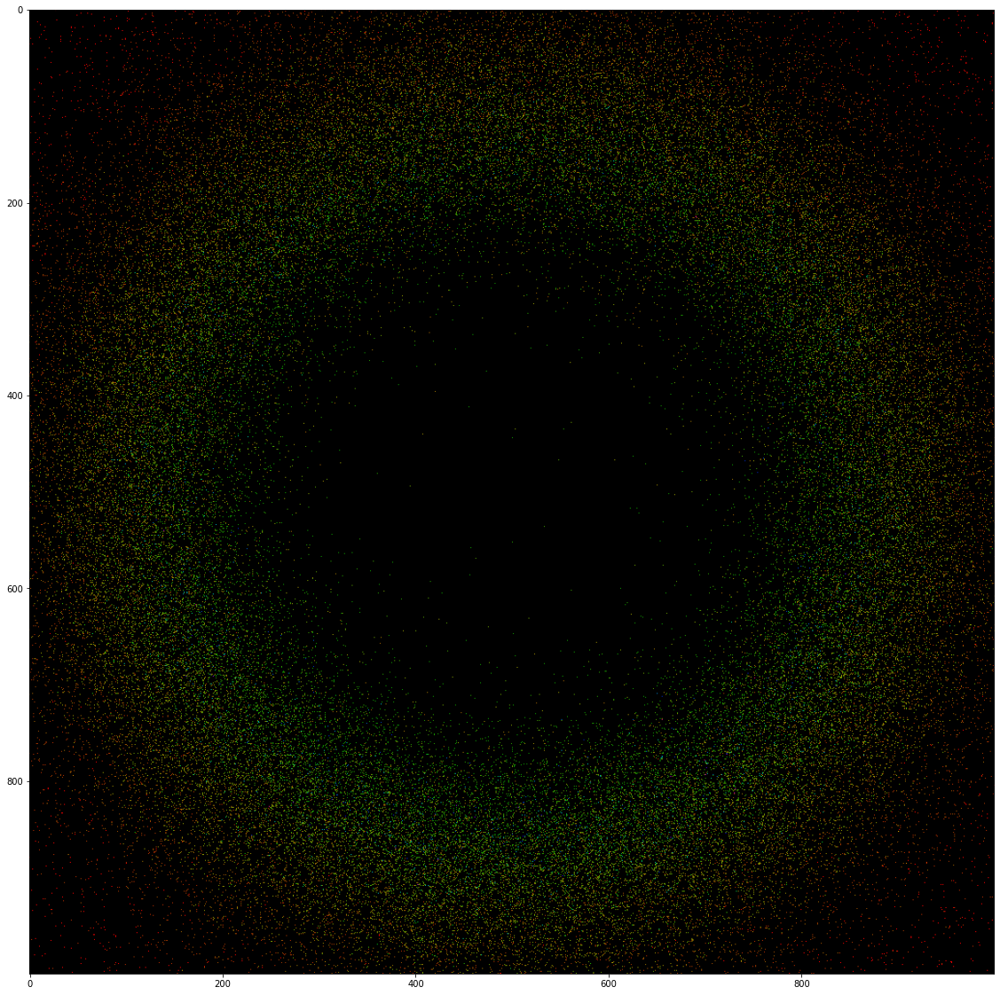

In [74]:
plt.imshow(frames[13])
plt.gcf().set_size_inches(20, 20)
plt.show()

# Eigenvector Orientations During Iteration

In [8]:
n = 100
iters = 1001

vecs = [np.random.randn(n, n)]
for i in tqdm(range(iters)):
    vals, _vecs = np.linalg.eig(vecs[-1])
    vecs.append(_vecs)
vecs = np.stack(vecs)

  0%|          | 0/1000 [00:00<?, ?it/s]

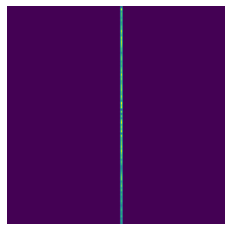

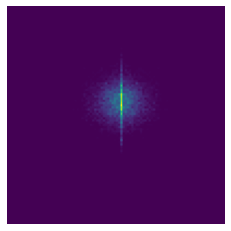

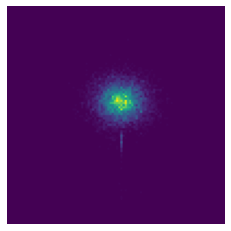

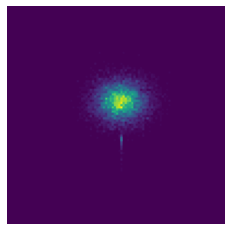

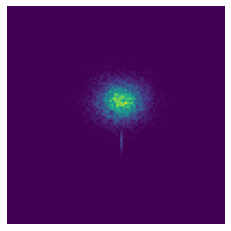

...

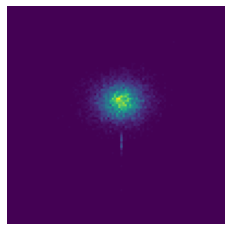

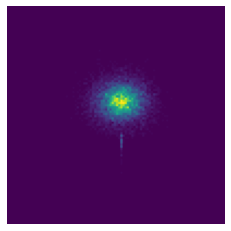

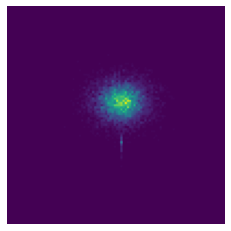

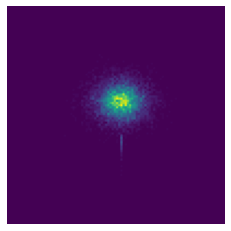

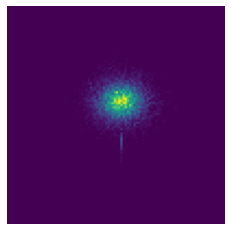

In [62]:
for i in range(100):
    hist, xedges, yedges = np.histogram2d(
        vecs[i].reshape(-1).real, 
        vecs[i].reshape(-1).imag,
        bins=100,
        range=[
            [vecs[1:].real.min(), vecs[1:].real.max()],
            [vecs[1:].imag.min(), vecs[1:].imag.max()]
        ]
    )
    plt.imshow(hist)
    plt.axis('off')
    plt.show()